In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sys
import seaborn as sns
import requests
import json
import folium

%matplotlib inline

In [2]:
data = pd.read_csv('./data/Bookings details export table_2021-11-08-035908.csv')

In [3]:
data.head()

,booking_id,hotel_details_id,session_id,created_at,booking_at,client_id,user_country_code,market,site_code,device_type,...,blended_forter_fraud_check_fee_usd,total_cost_of_sales_usd,revenue_in_usd,finance_revenue_usd,margin_percentage,rec_estimated_markup_usd,rec_actual_markup_usd,blended_markup_usd,cross_sell,trip_category
0,6396,6367,3caf9acd-08da-46f7-a4d8-8a66e34f5116,2021-06-20 00:21:58,2021-06-20 00:21:58,83e8bc0e-1175-4a80-9f54-570c04e9795b,AE,MENA,AE,smartphone-web,...,3.818704,24.324611,34.570026,-24.324611,0.039832,58.894637,NaN,0.000000,no_crosssell,domestic
1,6414,6385,CB8C17EC-41E5-4D68-8BA2-3EC6F61F6F26,2021-06-20 07:56:46,2021-06-20 07:56:46,4B4E27FC-F59C-4C45-B19C-43BF6E8BDB52,SA,MENA,SA,ios-app,...,2.749498,20.165920,37.560129,-20.165920,0.060107,57.726049,NaN,0.000000,no_crosssell,international
2,6481,6452,DE3C3C20-C2F7-4F46-9912-248F6C9F5432,2021-06-20 23:14:34,2021-06-20 23:14:34,3C830D6E-8F73-4604-B879-1945A125A2D0,TR,MENA,KW,ios-app,...,0.113276,1.080628,0.673177,0.673177,0.026148,1.753805,1.753805,1.753805,no_crosssell,international
3,6453,6424,3c50061b6b484bee97c0f9f5f7c0ee94,2021-06-20 18:41:22,2021-06-20 18:41:22,f207c180d418e744,AE,MENA,AE,android-app,...,0.204367,1.544899,0.807402,0.807402,0.017383,2.352301,2.352301,2.352301,no_crosssell,domestic
4,6477,6448,a48348dbdcb34c1a97d93427dd62eac5,2021-06-20 22:22:48,2021-06-20 22:22:48,74308c9d9ec21a1b,AE,MENA,AE,android-app,...,0.408722,2.817473,1.884405,1.884405,0.020286,4.701879,4.701879,4.701879,no_crosssell,domestic


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9268 entries, 0 to 9267
Columns: 128 entries, booking_id to trip_category
dtypes: float64(51), int64(23), object(54)
memory usage: 9.1+ MB


In [5]:
data.booking_at.min(),data.booking_at.max()

('2021-01-01 00:07:18', '2021-11-08 06:58:10')

In [6]:
data['booking_at']=pd.to_datetime(data['booking_at'])
data['created_at']=pd.to_datetime(data['created_at'])
data['check_in']=pd.to_datetime(data['check_in'])
data['check_out']=pd.to_datetime(data['check_out'])
data['refund_updated_at']=pd.to_datetime(data['refund_updated_at'])
data['card_expiry_date']=pd.to_datetime(data['card_expiry_date'])
data['cancellation_date']=pd.to_datetime(data['cancellation_date'])

In [7]:
def missing_value_table(df):
    #calculate all missing value 
    mis_val = df.isnull().sum()
    # %
    mis_val_percent = 100*df.isnull().sum()/len(df)
    #combine
    mis_val_table = pd.concat([mis_val,mis_val_percent],axis=1)
    mis_val_rename = mis_val_table.rename(columns = {0:'Missing values',1:'% of total values'})
    #sort
    mis_val_rename = mis_val_rename[mis_val_rename.iloc[:,1]!=0].sort_values('% of total values',ascending=False)
    return mis_val_rename


In [8]:
missing_value_table(data)[:100]

,Missing values,% of total values
destination_name,9268,100.000000
customer_city,9268,100.000000
add_on_price_usd,9085,98.025464
add_on_names,9085,98.025464
promo_max_discount_amount,9063,97.788088
promo_percentage,9063,97.788088
promo_code,9063,97.788088
promo_id,9063,97.788088
cancellation_date,8736,94.259819
refund_status,8735,94.249029


In [9]:
data['day_of_week'] = data.created_at.dt.day_name()
data['month_of_year'] = data.created_at.dt.month_name()
data.head()

,booking_id,hotel_details_id,session_id,created_at,booking_at,client_id,user_country_code,market,site_code,device_type,...,revenue_in_usd,finance_revenue_usd,margin_percentage,rec_estimated_markup_usd,rec_actual_markup_usd,blended_markup_usd,cross_sell,trip_category,day_of_week,month_of_year
0,6396,6367,3caf9acd-08da-46f7-a4d8-8a66e34f5116,2021-06-20 00:21:58,2021-06-20 00:21:58,83e8bc0e-1175-4a80-9f54-570c04e9795b,AE,MENA,AE,smartphone-web,...,34.570026,-24.324611,0.039832,58.894637,NaN,0.000000,no_crosssell,domestic,Sunday,June
1,6414,6385,CB8C17EC-41E5-4D68-8BA2-3EC6F61F6F26,2021-06-20 07:56:46,2021-06-20 07:56:46,4B4E27FC-F59C-4C45-B19C-43BF6E8BDB52,SA,MENA,SA,ios-app,...,37.560129,-20.165920,0.060107,57.726049,NaN,0.000000,no_crosssell,international,Sunday,June
2,6481,6452,DE3C3C20-C2F7-4F46-9912-248F6C9F5432,2021-06-20 23:14:34,2021-06-20 23:14:34,3C830D6E-8F73-4604-B879-1945A125A2D0,TR,MENA,KW,ios-app,...,0.673177,0.673177,0.026148,1.753805,1.753805,1.753805,no_crosssell,international,Sunday,June
3,6453,6424,3c50061b6b484bee97c0f9f5f7c0ee94,2021-06-20 18:41:22,2021-06-20 18:41:22,f207c180d418e744,AE,MENA,AE,android-app,...,0.807402,0.807402,0.017383,2.352301,2.352301,2.352301,no_crosssell,domestic,Sunday,June
4,6477,6448,a48348dbdcb34c1a97d93427dd62eac5,2021-06-20 22:22:48,2021-06-20 22:22:48,74308c9d9ec21a1b,AE,MENA,AE,android-app,...,1.884405,1.884405,0.020286,4.701879,4.701879,4.701879,no_crosssell,domestic,Sunday,June


In [10]:
cats_day = ['Monday', 'Tuesday','Thursday','Friday','Saturday','Sunday']
cats_month = ['January', 'February', 'March','April','May','June','July','August','September','October','November']

In [11]:
data.groupby(['day_of_week']).mean()

,booking_id,hotel_details_id,destination_name,lead_time,trip_duration,total_rooms,guests_count,adults_count,children_count,customer_city,...,estimated_gateway_total_fee_usd,blended_gateway_total_fee_usd,blended_forter_fraud_check_fee_usd,total_cost_of_sales_usd,revenue_in_usd,finance_revenue_usd,margin_percentage,rec_estimated_markup_usd,rec_actual_markup_usd,blended_markup_usd
day_of_week,,,,,,,,,,,,,,,,,,,,,
Friday,10469.841763,10441.280347,NaN,4.605491,2.557803,1.078035,2.088873,1.951590,0.137283,NaN,...,6.418615,6.418615,0.448363,6.866978,15.761355,14.123265,0.061883,21.922867,21.601201,20.356940
Monday,10230.197127,10201.745411,NaN,5.549082,2.746209,1.098962,2.114924,1.978452,0.136472,NaN,...,7.186946,7.186946,0.563179,7.757409,16.699729,15.034590,0.062919,23.542008,23.215735,21.974515
Saturday,10293.950454,10265.501239,NaN,4.943848,2.715111,1.095789,2.101569,1.968621,0.132948,NaN,...,6.836076,6.836076,0.494349,7.330425,16.697647,14.858449,0.061592,22.263487,21.415312,20.530444
Sunday,10128.326036,10100.003909,NaN,6.026583,2.725567,1.096169,2.111806,1.969507,0.142299,NaN,...,6.698281,6.698281,0.476898,7.175179,14.751017,13.038553,0.061526,21.257016,20.607607,19.557915
Thursday,10241.309411,10213.010156,NaN,4.715640,2.419093,1.085985,2.107651,1.973595,0.134056,NaN,...,6.494804,6.494804,0.472302,6.967107,15.473521,13.749887,0.062068,21.668854,20.458886,20.106222
Tuesday,9997.761194,9969.252946,NaN,5.329144,2.563236,1.088767,2.083268,1.958366,0.124902,NaN,...,7.235615,7.235615,0.606542,7.842157,17.310680,14.584624,0.062916,24.459651,23.124878,21.817870
Wednesday,10328.863408,10300.435658,NaN,5.125090,2.662832,1.110712,2.120776,1.980590,0.140187,NaN,...,6.915418,6.915418,0.504510,7.419928,16.156624,14.231135,0.061975,23.087985,22.254784,21.220517


In [12]:
data.groupby(['month_of_year']).mean()

,booking_id,hotel_details_id,destination_name,lead_time,trip_duration,total_rooms,guests_count,adults_count,children_count,customer_city,...,estimated_gateway_total_fee_usd,blended_gateway_total_fee_usd,blended_forter_fraud_check_fee_usd,total_cost_of_sales_usd,revenue_in_usd,finance_revenue_usd,margin_percentage,rec_estimated_markup_usd,rec_actual_markup_usd,blended_markup_usd
month_of_year,,,,,,,,,,,,,,,,,,,,,
April,2928.983516,2899.983516,NaN,7.994505,2.646520,1.064103,2.091575,1.891941,0.199634,NaN,...,6.483378,6.483378,0.907301,7.390679,11.097447,8.013652,0.051315,18.456826,17.129867,15.404331
August,11323.371280,11294.371280,NaN,3.886905,2.381696,1.110119,2.162202,2.001488,0.160714,NaN,...,6.597580,6.597580,0.127319,6.724899,17.879378,16.505575,0.068846,24.394008,24.188171,23.188019
February,1249.458333,1230.658333,NaN,10.433333,3.316667,1.075000,2.125000,1.958333,0.166667,NaN,...,7.641926,7.641926,0.981978,8.623904,9.938957,6.706887,0.043767,18.562861,18.036225,15.330791
January,899.416667,891.750000,NaN,12.595238,4.815476,1.059524,1.952381,1.851190,0.101190,NaN,...,9.122342,9.122342,1.192886,10.315228,12.273627,9.011342,0.041710,22.588854,22.705341,19.326570
July,8603.681301,8574.681301,NaN,4.560163,2.654472,1.121138,2.225203,2.068293,0.156911,NaN,...,7.040852,7.040852,1.130556,8.171408,17.129313,15.242916,0.063352,25.299851,24.678336,23.414324
June,6218.354839,6189.354839,NaN,5.021822,3.019924,1.088235,2.038899,1.930740,0.108159,NaN,...,6.220912,6.220912,0.997963,7.218875,13.211403,10.617867,0.052685,20.430278,19.066862,17.836742
March,1906.208426,1878.266075,NaN,6.516630,2.694013,1.070953,2.062084,1.898004,0.164080,NaN,...,6.960629,6.960629,0.938538,7.899167,11.816796,9.148141,0.052019,19.715962,18.661009,17.047308
May,4380.558824,4351.558824,NaN,4.683007,2.423747,1.128540,2.261438,2.079521,0.181917,NaN,...,5.825136,5.825136,0.932284,6.757419,12.929872,10.350485,0.055448,19.648036,18.499434,17.068649
November,19422.386167,19393.386167,NaN,6.103746,2.481268,1.060519,2.023055,1.936599,0.086455,NaN,...,8.645767,8.645767,0.000000,8.645767,21.103769,20.529442,0.066000,23.371537,14.167374,23.225237


In [13]:
price_week = data.groupby(['day_of_week']).mean().reindex(cats_day)
price_week

,booking_id,hotel_details_id,destination_name,lead_time,trip_duration,total_rooms,guests_count,adults_count,children_count,customer_city,...,estimated_gateway_total_fee_usd,blended_gateway_total_fee_usd,blended_forter_fraud_check_fee_usd,total_cost_of_sales_usd,revenue_in_usd,finance_revenue_usd,margin_percentage,rec_estimated_markup_usd,rec_actual_markup_usd,blended_markup_usd
day_of_week,,,,,,,,,,,,,,,,,,,,,
Monday,10230.197127,10201.745411,NaN,5.549082,2.746209,1.098962,2.114924,1.978452,0.136472,NaN,...,7.186946,7.186946,0.563179,7.757409,16.699729,15.034590,0.062919,23.542008,23.215735,21.974515
Tuesday,9997.761194,9969.252946,NaN,5.329144,2.563236,1.088767,2.083268,1.958366,0.124902,NaN,...,7.235615,7.235615,0.606542,7.842157,17.310680,14.584624,0.062916,24.459651,23.124878,21.817870
Thursday,10241.309411,10213.010156,NaN,4.715640,2.419093,1.085985,2.107651,1.973595,0.134056,NaN,...,6.494804,6.494804,0.472302,6.967107,15.473521,13.749887,0.062068,21.668854,20.458886,20.106222
Friday,10469.841763,10441.280347,NaN,4.605491,2.557803,1.078035,2.088873,1.951590,0.137283,NaN,...,6.418615,6.418615,0.448363,6.866978,15.761355,14.123265,0.061883,21.922867,21.601201,20.356940
Saturday,10293.950454,10265.501239,NaN,4.943848,2.715111,1.095789,2.101569,1.968621,0.132948,NaN,...,6.836076,6.836076,0.494349,7.330425,16.697647,14.858449,0.061592,22.263487,21.415312,20.530444
Sunday,10128.326036,10100.003909,NaN,6.026583,2.725567,1.096169,2.111806,1.969507,0.142299,NaN,...,6.698281,6.698281,0.476898,7.175179,14.751017,13.038553,0.061526,21.257016,20.607607,19.557915


In [14]:
price_month = data.groupby(['month_of_year']).mean().reindex(cats_month)
price_month

,booking_id,hotel_details_id,destination_name,lead_time,trip_duration,total_rooms,guests_count,adults_count,children_count,customer_city,...,estimated_gateway_total_fee_usd,blended_gateway_total_fee_usd,blended_forter_fraud_check_fee_usd,total_cost_of_sales_usd,revenue_in_usd,finance_revenue_usd,margin_percentage,rec_estimated_markup_usd,rec_actual_markup_usd,blended_markup_usd
month_of_year,,,,,,,,,,,,,,,,,,,,,
January,899.416667,891.750000,NaN,12.595238,4.815476,1.059524,1.952381,1.851190,0.101190,NaN,...,9.122342,9.122342,1.192886,10.315228,12.273627,9.011342,0.041710,22.588854,22.705341,19.326570
February,1249.458333,1230.658333,NaN,10.433333,3.316667,1.075000,2.125000,1.958333,0.166667,NaN,...,7.641926,7.641926,0.981978,8.623904,9.938957,6.706887,0.043767,18.562861,18.036225,15.330791
March,1906.208426,1878.266075,NaN,6.516630,2.694013,1.070953,2.062084,1.898004,0.164080,NaN,...,6.960629,6.960629,0.938538,7.899167,11.816796,9.148141,0.052019,19.715962,18.661009,17.047308
April,2928.983516,2899.983516,NaN,7.994505,2.646520,1.064103,2.091575,1.891941,0.199634,NaN,...,6.483378,6.483378,0.907301,7.390679,11.097447,8.013652,0.051315,18.456826,17.129867,15.404331
May,4380.558824,4351.558824,NaN,4.683007,2.423747,1.128540,2.261438,2.079521,0.181917,NaN,...,5.825136,5.825136,0.932284,6.757419,12.929872,10.350485,0.055448,19.648036,18.499434,17.068649
June,6218.354839,6189.354839,NaN,5.021822,3.019924,1.088235,2.038899,1.930740,0.108159,NaN,...,6.220912,6.220912,0.997963,7.218875,13.211403,10.617867,0.052685,20.430278,19.066862,17.836742
July,8603.681301,8574.681301,NaN,4.560163,2.654472,1.121138,2.225203,2.068293,0.156911,NaN,...,7.040852,7.040852,1.130556,8.171408,17.129313,15.242916,0.063352,25.299851,24.678336,23.414324
August,11323.371280,11294.371280,NaN,3.886905,2.381696,1.110119,2.162202,2.001488,0.160714,NaN,...,6.597580,6.597580,0.127319,6.724899,17.879378,16.505575,0.068846,24.394008,24.188171,23.188019
September,14369.638614,14340.638614,NaN,3.956064,2.489480,1.086634,2.049505,1.938738,0.110767,NaN,...,6.309628,6.309628,0.000000,6.309628,17.784817,16.677748,0.070713,23.072565,23.087763,21.977634


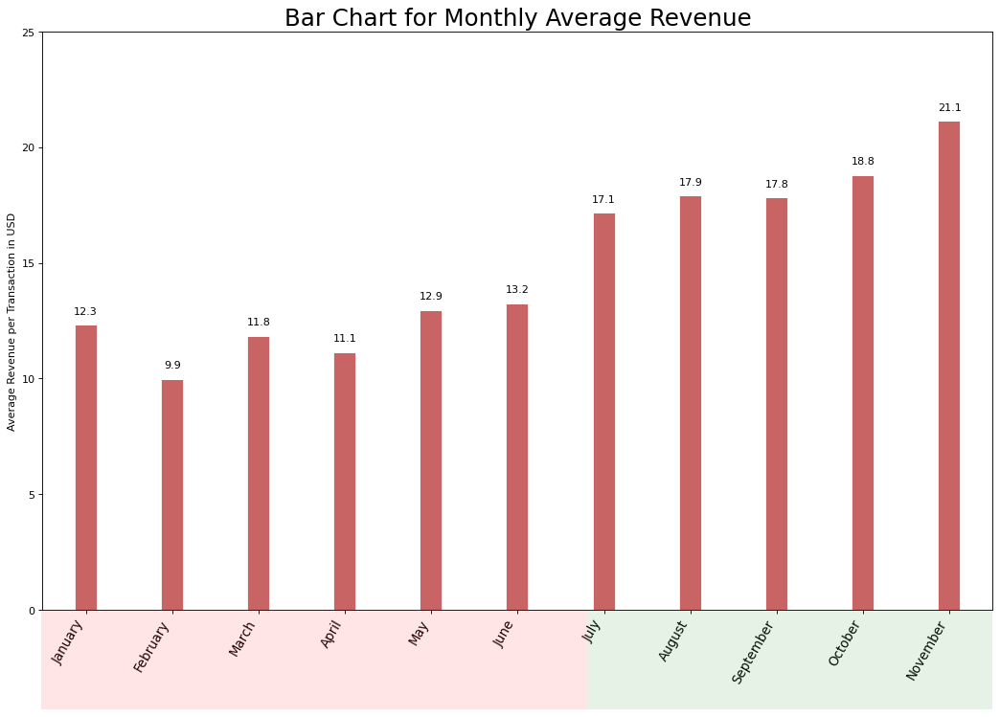

In [15]:
# Select Data
df_month = price_month[['revenue_in_usd', 'total_cost_of_sales_usd']]

# Draw plot
import matplotlib.patches as patches

fig, ax = plt.subplots(figsize=(16,10), facecolor='white', dpi= 80)
ax.vlines(x=df_month.index, ymin=0, ymax=df_month.revenue_in_usd, color='firebrick', alpha=0.7, linewidth=20)

# Annotate Text
for i, revenue_in_usd in enumerate(df_month.revenue_in_usd):
    ax.text(i, revenue_in_usd+0.5, round(revenue_in_usd, 1), horizontalalignment='center')


# Title, Label, Ticks and Ylim
ax.set_title('Bar Chart for Monthly Average Revenue', fontdict={'size':22})
ax.set(ylabel='Average Revenue per Transaction in USD', ylim=(0, 25))
plt.xticks(df_month.index, rotation=60, horizontalalignment='right', fontsize=12)

# Add patches to color the X axis labels
p1 = patches.Rectangle((.57, -0.005), width=.33, height=.13, alpha=.1, facecolor='green', transform=fig.transFigure)
p2 = patches.Rectangle((.124, -0.005), width=.446, height=.13, alpha=.1, facecolor='red', transform=fig.transFigure)
fig.add_artist(p1)
fig.add_artist(p2)
plt.show()


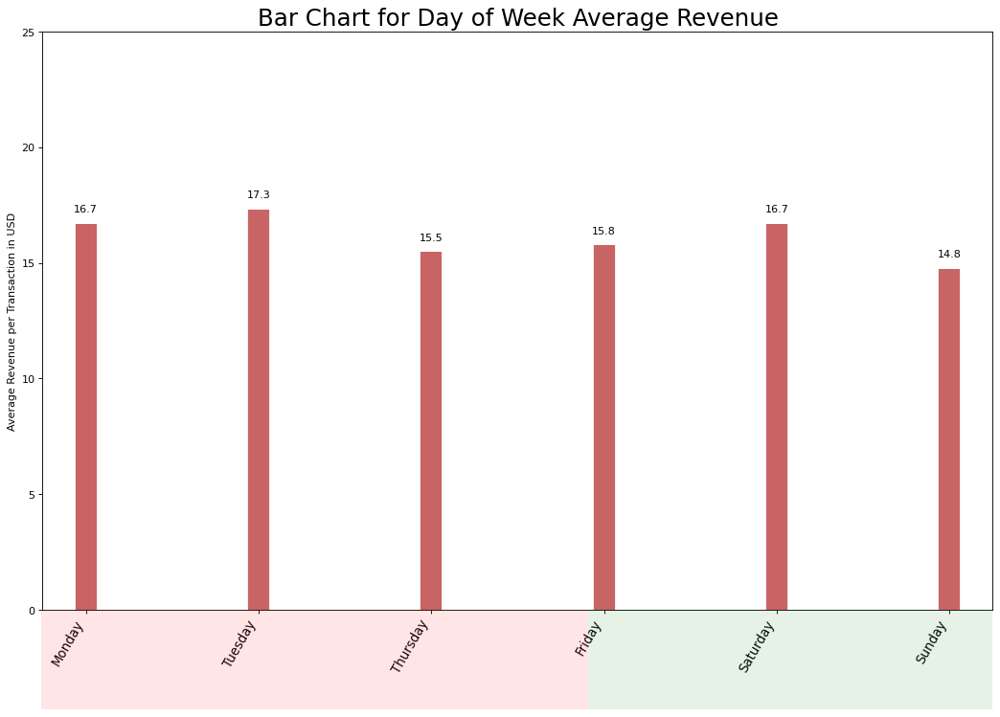

In [16]:
# Select Data
df_week = price_week[['revenue_in_usd', 'total_cost_of_sales_usd']]

# Draw plot

fig, ax = plt.subplots(figsize=(16,10), facecolor='white', dpi= 80)
ax.vlines(x=df_week.index, ymin=0, ymax=df_week.revenue_in_usd, color='firebrick', alpha=0.7, linewidth=20)

# Annotate Text
for i, revenue_in_usd in enumerate(df_week.revenue_in_usd):
    ax.text(i, revenue_in_usd+0.5, round(revenue_in_usd, 1), horizontalalignment='center')


# Title, Label, Ticks and Ylim
ax.set_title('Bar Chart for Day of Week Average Revenue', fontdict={'size':22})
ax.set(ylabel='Average Revenue per Transaction in USD', ylim=(0, 25))
plt.xticks(df_week.index, rotation=60, horizontalalignment='right', fontsize=12)

# Add patches to color the X axis labels
p1 = patches.Rectangle((.57, -0.005), width=.33, height=.13, alpha=.1, facecolor='green', transform=fig.transFigure)
p2 = patches.Rectangle((.124, -0.005), width=.446, height=.13, alpha=.1, facecolor='red', transform=fig.transFigure)
fig.add_artist(p1)
fig.add_artist(p2)
plt.show()


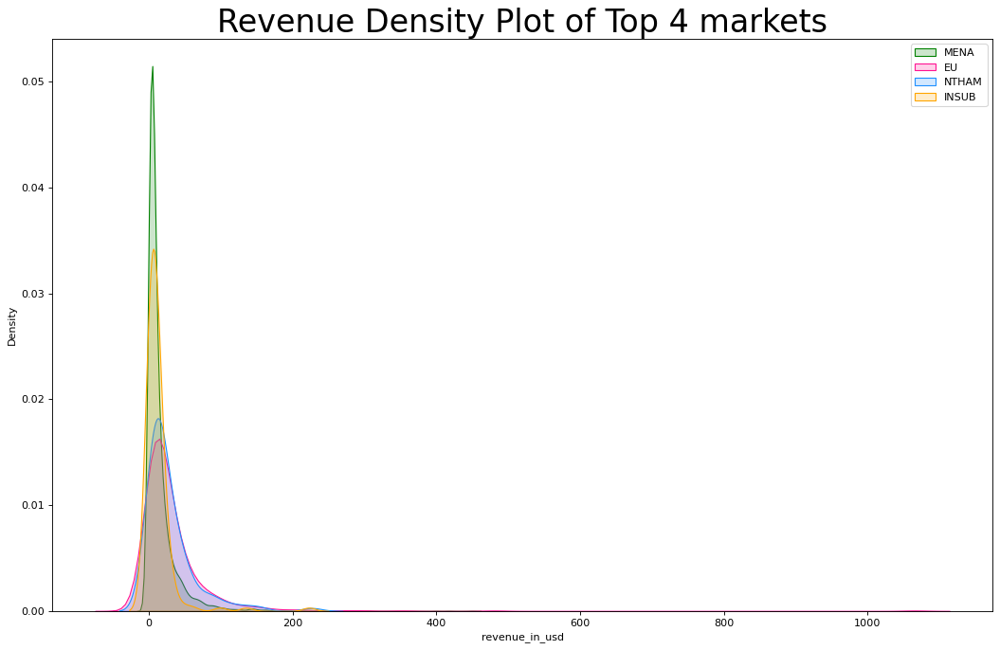

In [17]:
# Draw Plot
plt.figure(figsize=(16,10), dpi= 80)
sns.kdeplot(data.loc[data['hotel_market'] == 'MENA', "revenue_in_usd"], shade=True, color="g", label="MENA", alpha=.2)
sns.kdeplot(data.loc[data['hotel_market'] == 'EU', "revenue_in_usd"], shade=True, color="deeppink", label="EU", alpha=.2)
sns.kdeplot(data.loc[data['hotel_market'] == 'NTHAM', "revenue_in_usd"], shade=True, color="dodgerblue", label="NTHAM", alpha=.2)
sns.kdeplot(data.loc[data['hotel_market'] == 'INSUB', "revenue_in_usd"], shade=True, color="orange", label="INSUB", alpha=.2)

# Decoration
plt.title('Revenue Density Plot of Top 4 markets', fontsize=30)
plt.legend()

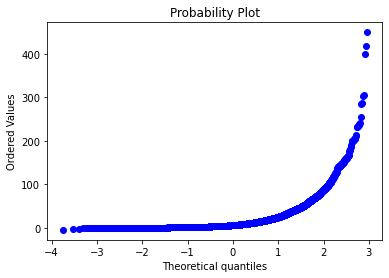

In [18]:
import scipy.stats as stats
import pylab 

measurements = data.loc[data['hotel_market'] == 'MENA', "revenue_in_usd"]   
stats.probplot(measurements, dist="norm", plot=pylab)
pylab.show()

In [19]:
data.wego_total_price_usd.describe()

count    9268.000000
mean      242.907517
std       349.910750
min         3.485060
25%        63.017969
50%       125.998866
75%       285.117419
max      7043.784675
Name: wego_total_price_usd, dtype: float64

In [20]:
data.revenue_in_usd.describe()

count    9252.000000
mean       16.096350
std        29.338213
min       -26.490145
25%         2.933317
50%         6.819574
75%        17.496143
max      1065.775736
Name: revenue_in_usd, dtype: float64

<AxesSubplot:>

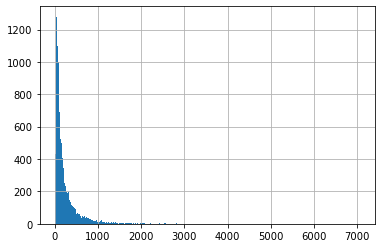

In [21]:
data.wego_total_price_usd.hist(bins=300)

<AxesSubplot:>

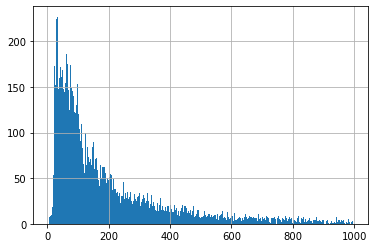

In [22]:
data.loc[(data['wego_total_price_usd']<=1000) & (data['wego_total_price_usd']>0)].wego_total_price_usd.hist(bins=300)

In [23]:
market_order_number = data.groupby(['hotel_market']).count()
market_mean = data.groupby(['hotel_market']).mean()
market_agg = data.groupby(['hotel_market']).sum()
market_size = data.groupby(['hotel_market']).size()

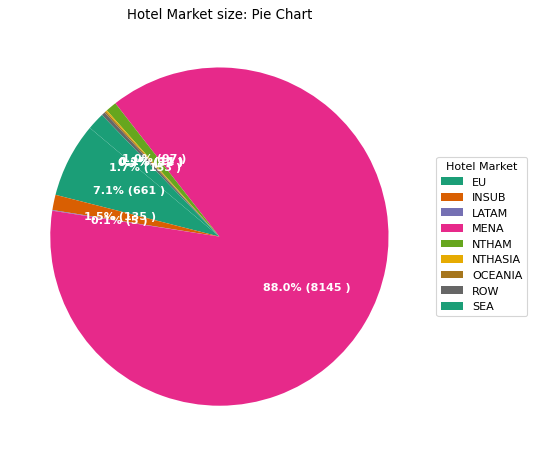

In [52]:
# Prepare Data
df = data.groupby('hotel_market').size().reset_index(name='counts')

# Draw Plot
fig, ax = plt.subplots(figsize=(12, 7), subplot_kw=dict(aspect="equal"), dpi= 80)

data1 = df['counts']
categories = df['hotel_market']
explode = [0,0,0,0,0,0.1,0]

def func(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return "{:.1f}% ({:d} )".format(pct, absolute)

wedges, texts, autotexts = ax.pie(data1, 
                                  autopct=lambda pct: func(pct, data1),
                                  textprops=dict(color="w"), 
                                  colors=plt.cm.Dark2.colors,
                                 startangle=140)

# Decoration
ax.legend(wedges, categories, title="Hotel Market", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
plt.setp(autotexts, size=10, weight=700)
ax.set_title("Hotel Market size: Pie Chart")
plt.show()

<AxesSubplot:xlabel='hotel_market', ylabel='wego_total_price_usd'>

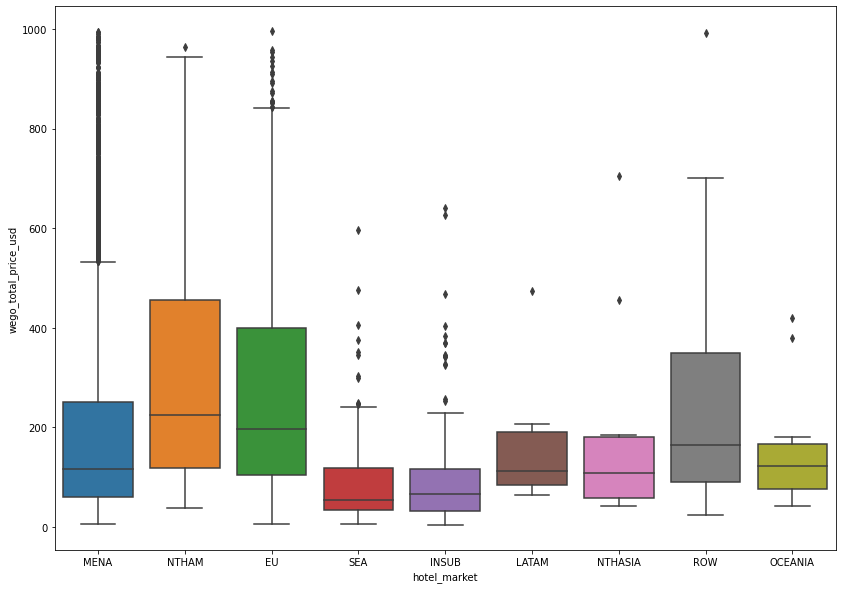

In [25]:
f,ax = plt.subplots(figsize=(14,10))
sns.boxplot(y='wego_total_price_usd',x='hotel_market',data=data.loc[(data['wego_total_price_usd']<=1000) & (data['wego_total_price_usd']>0)])

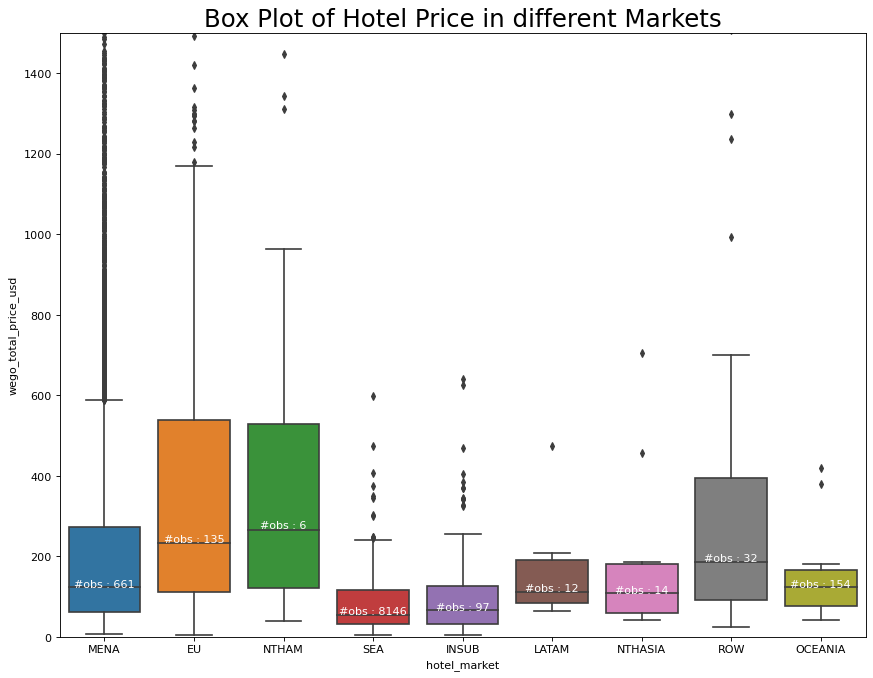

In [48]:
# Draw Plot
plt.figure(figsize=(13,10), dpi= 80)
sns.boxplot(x='hotel_market', y='wego_total_price_usd', data=data, notch=False)

# Add N Obs inside boxplot (optional)
def add_n_obs(data,group_col,y):
    medians_dict = {grp[0]:grp[1][y].median() for grp in data.groupby(group_col)}
    xticklabels = [x.get_text() for x in plt.gca().get_xticklabels()]
    n_obs = data.groupby(group_col)[y].size().values
    for (x, xticklabel), n_ob in zip(enumerate(xticklabels), n_obs):
        plt.text(x, medians_dict[xticklabel]*1.01, "#obs : "+str(n_ob), horizontalalignment='center', fontdict={'size':10}, color='white')

add_n_obs(data,group_col='hotel_market',y='wego_total_price_usd')    

# Decoration
plt.title('Box Plot of Hotel Price in different Markets', fontsize=22)
plt.ylim(0, 1500)
plt.show()

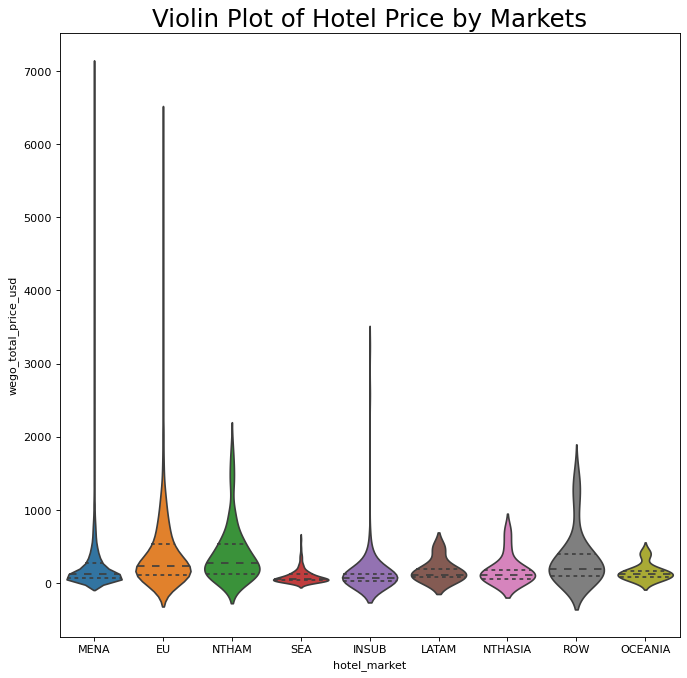

In [57]:

# Draw Plot
plt.figure(figsize=(10,10), dpi= 80)
sns.violinplot(x='hotel_market', y='wego_total_price_usd', data=data, scale='width', inner='quartile')

# Decoration
plt.title('Violin Plot of Hotel Price by Markets', fontsize=22)
plt.show()

<AxesSubplot:xlabel='hotel_market', ylabel='revenue_in_usd'>

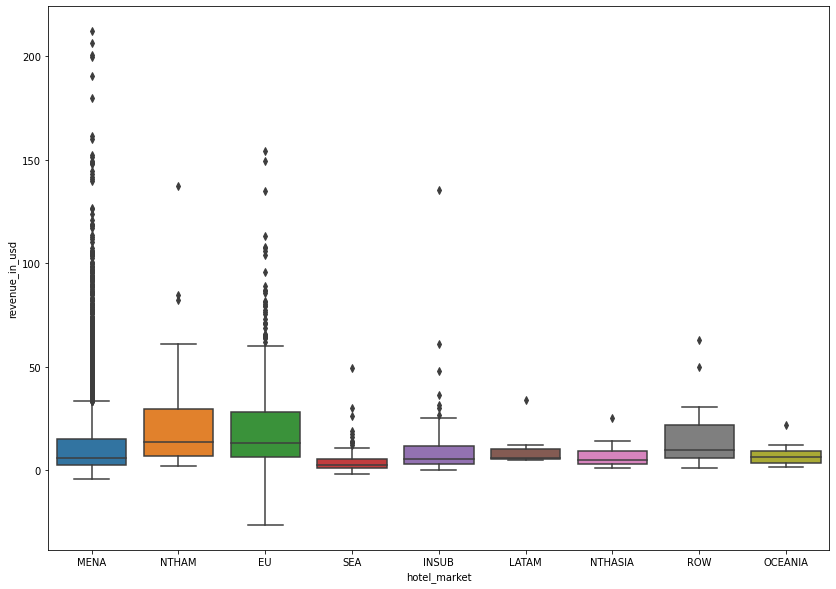

In [41]:
f,ax = plt.subplots(figsize=(14,10))
sns.boxplot(y='revenue_in_usd',x='hotel_market',data=data.loc[(data['wego_total_price_usd']<=1000) & (data['wego_total_price_usd']>0)])

<AxesSubplot:xlabel='hotel_stars', ylabel='wego_total_price_usd'>

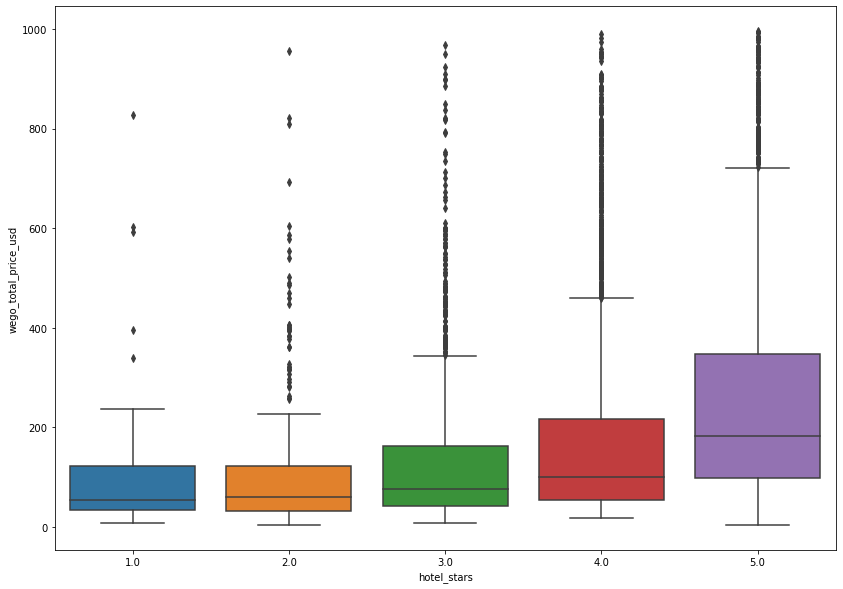

In [27]:
f,ax = plt.subplots(figsize=(14,10))
sns.boxplot(y='wego_total_price_usd',x='hotel_stars',data=data.loc[(data['wego_total_price_usd']<=1000) & (data['wego_total_price_usd']>0)])

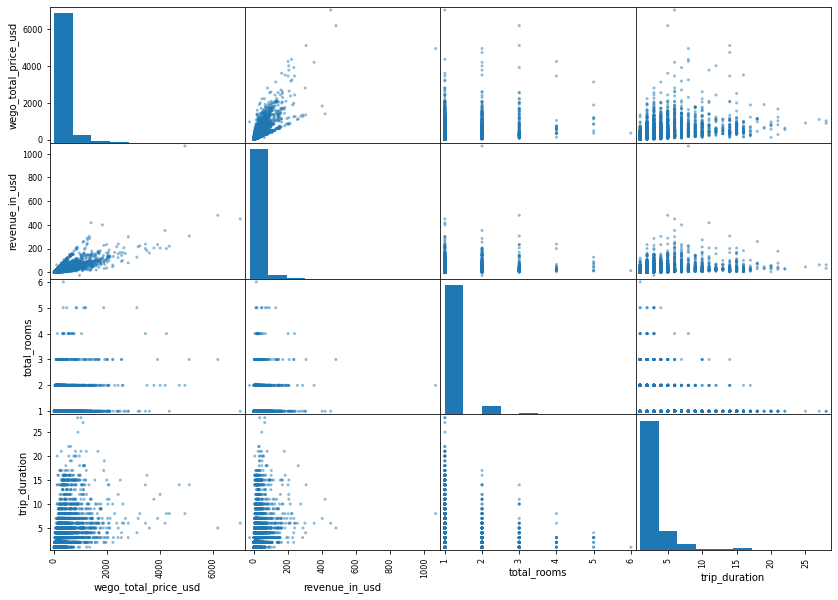

In [28]:
from pandas.plotting import scatter_matrix

atttibutes = ['wego_total_price_usd','revenue_in_usd','total_rooms','trip_duration']
scatter_matrix(data[atttibutes],figsize=(14,10))
plt.show()

In [31]:
for i, row in data.iterrows():
    apiAddress = str(data.at[i,'hotel_address'])
    
    parameters = {
        "key": "2G7G8gjC90kQ8GEhSLqTS8pA0GvuLtDk",
        "location": apiAddress
    }

    response = requests.get("http://www.mapquestapi.com/geocoding/v1/address", params=parameters)
    print(response)
    dataA = response.text
    dataJ = json.loads(dataA)['results']
    lat = (dataJ[0]['locations'][0]['latLng']['lat'])
    lng = (dataJ[0]['locations'][0]['latLng']['lng'])
    
    data.at[i,'lat'] = lat
    data.at[i,'lng'] = lng

data.to_csv('wego_geo.csv')

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200

In [33]:
data.to_csv('wego_geomap.csv')

In [63]:
map_df = pd.read_csv('wego_geomap.csv')
map_df.head()

,Unnamed: 0,booking_id,hotel_details_id,session_id,created_at,booking_at,client_id,user_country_code,market,site_code,...,margin_percentage,rec_estimated_markup_usd,rec_actual_markup_usd,blended_markup_usd,cross_sell,trip_category,day_of_week,month_of_year,lat,lng
0,0,6396,6367,3caf9acd-08da-46f7-a4d8-8a66e34f5116,2021-06-20 00:21:58.000,2021-06-20 00:21:58.000,83e8bc0e-1175-4a80-9f54-570c04e9795b,AE,MENA,AE,...,0.039832,58.894637,NaN,0.000000,no_crosssell,domestic,Sunday,June,25.34513,55.38619
1,1,6414,6385,CB8C17EC-41E5-4D68-8BA2-3EC6F61F6F26,2021-06-20 07:56:46.000,2021-06-20 07:56:46.000,4B4E27FC-F59C-4C45-B19C-43BF6E8BDB52,SA,MENA,SA,...,0.060107,57.726049,NaN,0.000000,no_crosssell,international,Sunday,June,43.87582,-0.52004
2,2,6481,6452,DE3C3C20-C2F7-4F46-9912-248F6C9F5432,2021-06-20 23:14:34.000,2021-06-20 23:14:34.000,3C830D6E-8F73-4604-B879-1945A125A2D0,TR,MENA,KW,...,0.026148,1.753805,1.753805,1.753805,no_crosssell,international,Sunday,June,53.57984,-114.26327
3,3,6453,6424,3c50061b6b484bee97c0f9f5f7c0ee94,2021-06-20 18:41:22.000,2021-06-20 18:41:22.000,f207c180d418e744,AE,MENA,AE,...,0.017383,2.352301,2.352301,2.352301,no_crosssell,domestic,Sunday,June,24.22236,55.78017
4,4,6477,6448,a48348dbdcb34c1a97d93427dd62eac5,2021-06-20 22:22:48.000,2021-06-20 22:22:48.000,74308c9d9ec21a1b,AE,MENA,AE,...,0.020286,4.701879,4.701879,4.701879,no_crosssell,domestic,Sunday,June,24.22236,55.78017


In [61]:
# define the world map
world_map = folium.Map()

# display world map
world_map

In [62]:
# MENA latitude and longitude values
latitude = 29.29
longitude = 42.55

# Create map and display it
mena_map = folium.Map(location=[latitude, longitude], zoom_start=12)

# Display the map of MENA
mena_map

In [65]:
# get the first 2000 records in the MENA
limit = 2000
df_mane = map_df.loc[map_df['hotel_market']=='MENA']
map_data = df_mane.iloc[0:limit, :]

# Instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# Loop through the 2000 cases and add each to the incidents feature group
for lat, lng, in zip(df_mane.lat, map_data.lng):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=7, # define how big the size
            color='yellow',
            fill=True,
            fill_color='red',
            fill_opacity=0.4
        )
    )

# Add incidents to map
mane_map = folium.Map(location=[latitude, longitude], zoom_start=12)
mane_map.add_child(incidents)


In [67]:
# add pop-up text to each marker on the map
latitudes = list(map_data.lat)
longitudes = list(map_data.lng)
labels = list(map_data.hotel_name)

for lat, lng, label in zip(latitudes, longitudes, labels):
    folium.Marker([lat, lng], popup=label).add_to(mane_map)    
    
# add incidents to map
mane_map.add_child(incidents)

In [69]:
from folium import plugins

# let's start again with a clean copy of the map of San Francisco
mane_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(mane_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(map_data.lat, map_data.lng, map_df.hotel_name):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# add incidents to map
mane_map.add_child(incidents)

In [70]:
from folium.plugins import HeatMap

# let's start again with a clean copy of the map of San Francisco
mane_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

# Convert data format
heatdata = map_data[['lat','lng']].values.tolist()

# add incidents to map
HeatMap(heatdata).add_to(mane_map)

mane_map